In [19]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import os
import operator
import math
import getopt
import sys
import random
from pylab import rcParams
rcParams['figure.figsize'] = 15, 30

In [20]:
class one_image:
    keypoints_FAST = [[]]
    best_FAST_kp = []
    keypoints_SIFT = [[]]
    best_SIFT_kp = []
    SIFT_des = [[]]
    # Initializing class one_image
    def __init__(self, path):
        self.path = path
        self.gray = cv.imread(img_path, 0)
        self.color = cv.imread(img_path, 1)
        self.name = path[9:] # Parameter 9 denotes the length of "./images/", making self.name is the same as file name.
    def get_keypoints_FAST(self):
        fast = cv.FastFeatureDetector_create()
        kp = fast.detect(self.gray, None)
        self.keypoints_FAST = kp
    def get_keypoints_SIFT(self):
        sift = cv.SIFT_create()
        kp = sift.detect(self.gray,None)
        self.keypoints_SIFT = kp
    def draw_keypoints(self, keypoints = [[]], name = " "):
        img2 = cv.drawKeypoints(self.color, keypoints, None, color=(0,0,255)) 
        # OpenCV does not use RGB, it uses BGR (standing for blue, green, red). You need to swap the order of the red and the blue. 
        b,g,r = cv.split(img2)           # get b, g, r
        rgb_img = cv.merge([r,g,b])     # switch it to r, g, b
        plt.imshow(rgb_img)
        plt.title(name)
        plt.show()
    def get_best_FAST_kp(self, N):
        fast_dist = {}
        for kp in self.keypoints_FAST:
            fast_dist[kp] = kp.response
        sorted_d = sorted(fast_dist.items(), key=operator.itemgetter(1))
        sorted_d = dict(sorted_d[-N:])
        self.best_FAST_kp = []
        for key in sorted_d.keys():
            self.best_FAST_kp.append(key)
        self.best_FAST_kp = tuple(self.best_FAST_kp)
    def get_best_SIFT_kp(self, N):
        best_dist = {}
        for kp in self.keypoints_SIFT:
            best_dist[kp] = kp.response
        sorted_d = sorted(best_dist.items(), key=operator.itemgetter(1))
        sorted_d = dict(sorted_d[-N:])
        self.best_SIFT_kp = []
        for key in sorted_d.keys():
            self.best_SIFT_kp.append(key)
        self.best_SIFT_kp = tuple(self.best_SIFT_kp)
    def get_sift_des(self):
        sift = cv.SIFT_create()
        m, self.SIFT_des = sift.compute(self.gray, self.best_SIFT_kp)

## This part is for reading files

In [21]:
image_list = []
for img in os.listdir("./images/"):
    img_path = "./images/" + img
    a = one_image(img_path)
    image_list.append(a)

In [22]:
image_list[0].gray

array([[255, 248, 253, ..., 247, 231,  97],
       [255, 248, 253, ..., 249, 193,  47],
       [255, 248, 253, ..., 158,  76,  22],
       ...,
       [213, 172, 182, ..., 103, 119,  57],
       [212, 170, 180, ..., 103, 120,  57],
       [208, 166, 175, ..., 108, 127,  65]], dtype=uint8)

## Using FAST and SIFT detecting features

In [4]:
for i in range(3):
    image_list[i].get_keypoints_FAST()
    image_list[i].get_keypoints_SIFT()

In [5]:
a = image_list[0].keypoints_FAST
a[0].pt

(517.0, 3.0)

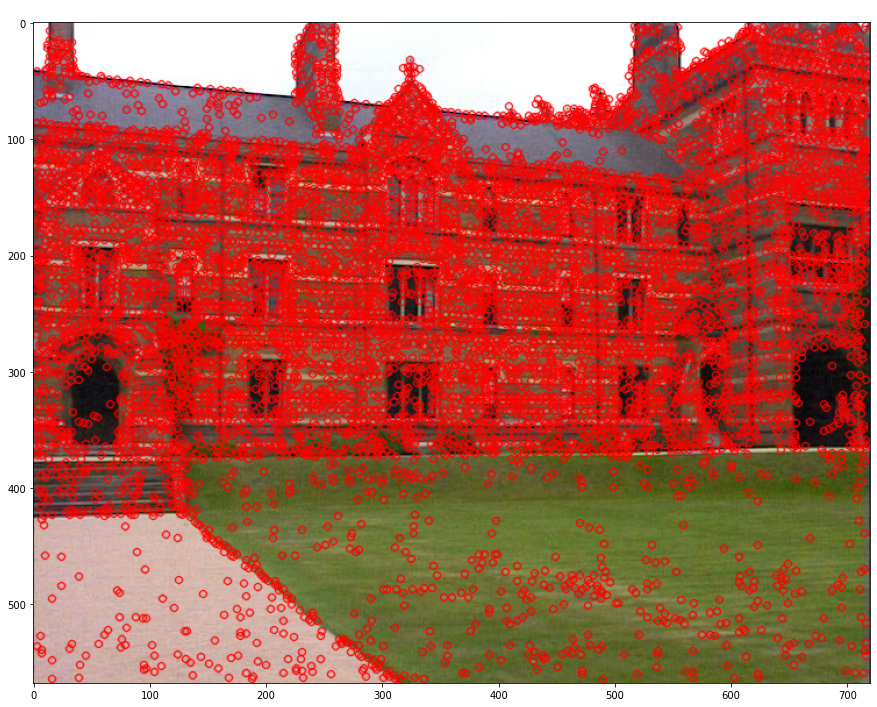

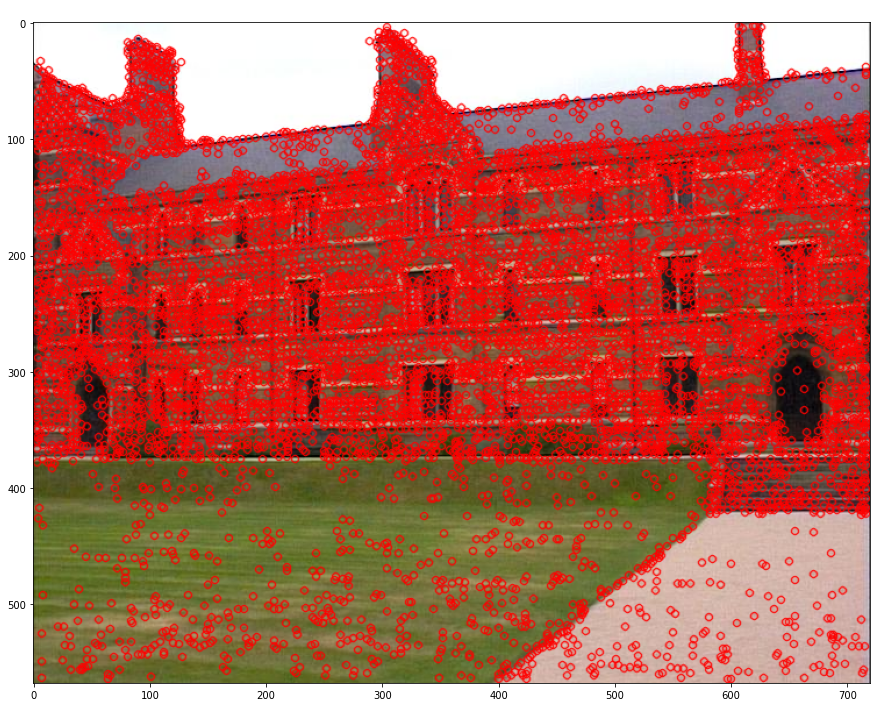

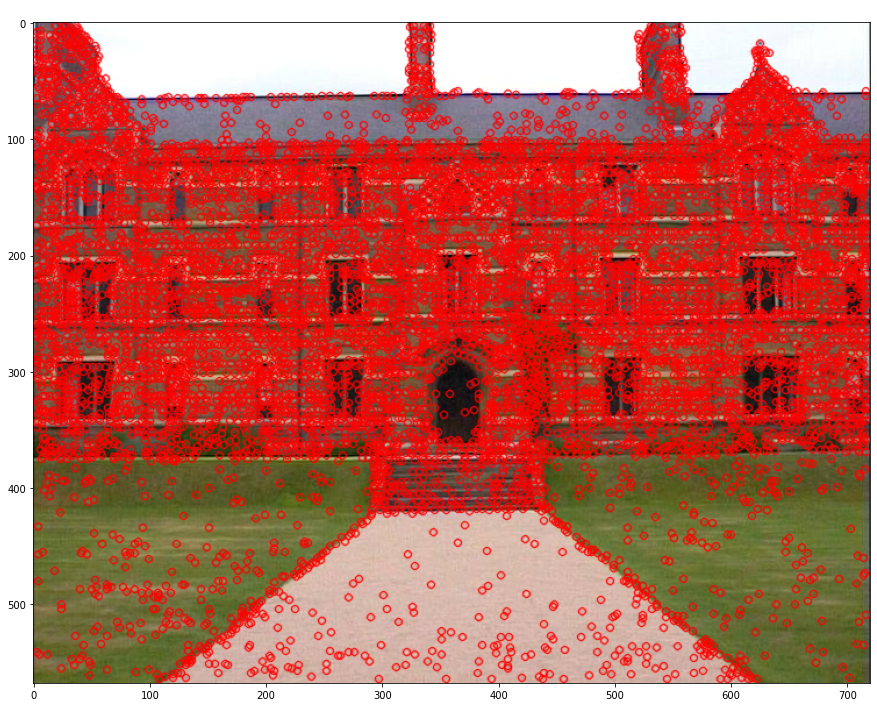

In [6]:
for img in image_list:
    img.draw_keypoints(img.keypoints_FAST, )

In [7]:
for img in image_list:
    print("The number of keypoints using FAST in " + img.name)
    print(len(img.keypoints_FAST))
    print("The number of keypoints using SIFT in " + img.name)
    print(len(img.keypoints_SIFT))

The number of keypoints using FAST in keble_c.jpg
8793
The number of keypoints using SIFT in keble_c.jpg
4014
The number of keypoints using FAST in keble_a.jpg
9066
The number of keypoints using SIFT in keble_a.jpg
4055
The number of keypoints using FAST in keble_b.jpg
9235
The number of keypoints using SIFT in keble_b.jpg
4187


In [8]:
# just get 200 best keypoints
for i in range(3):
    image_list[i].get_best_FAST_kp(200)
    image_list[i].get_best_SIFT_kp(200)

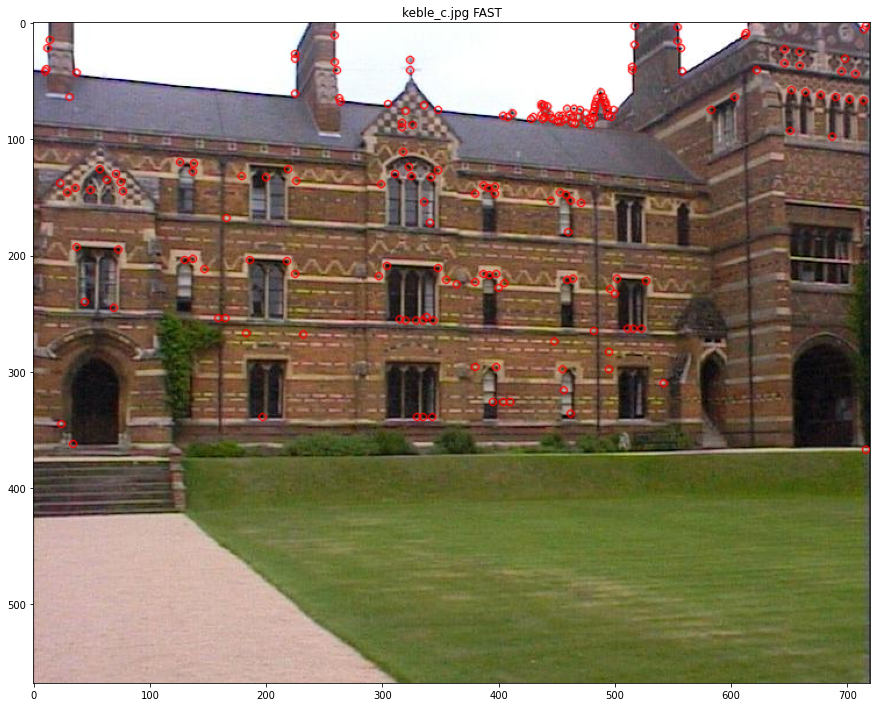

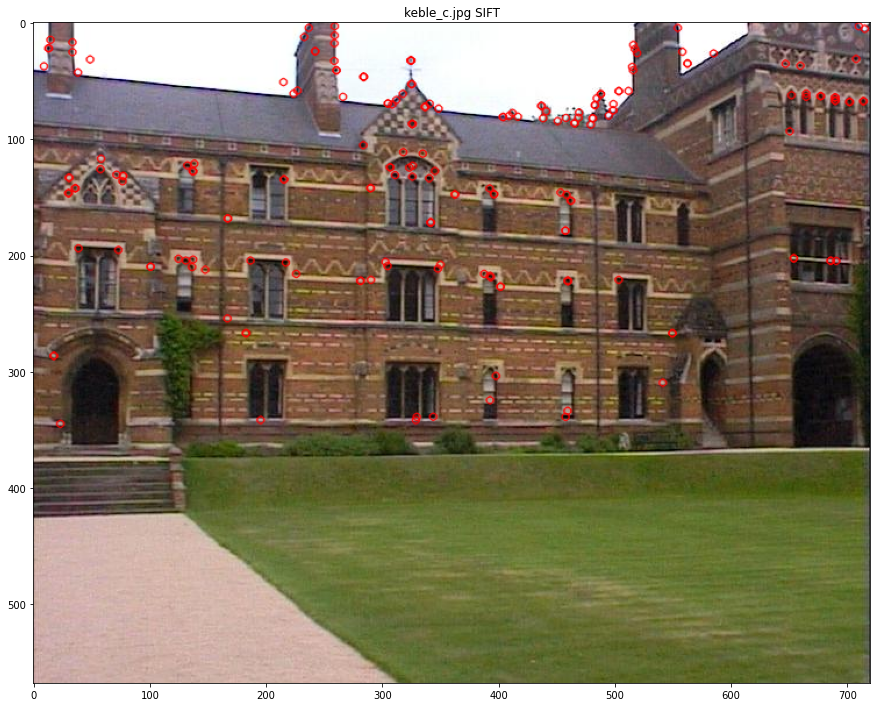

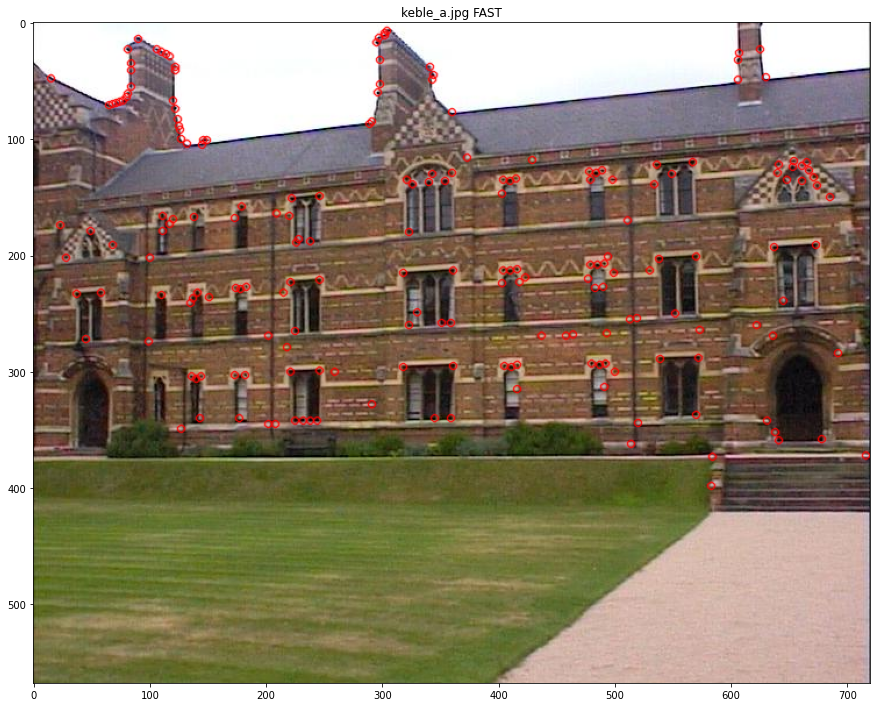

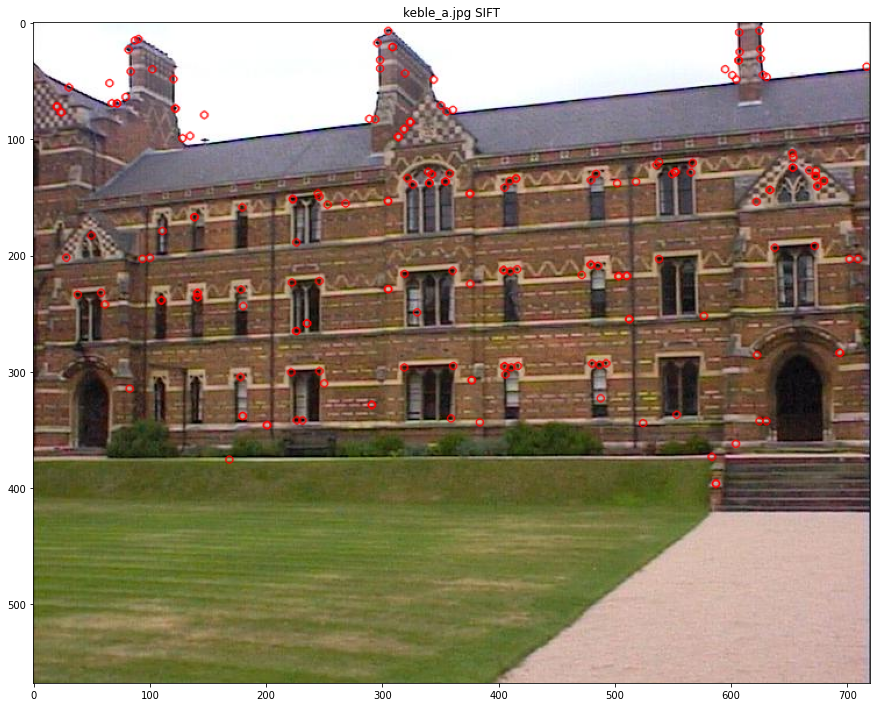

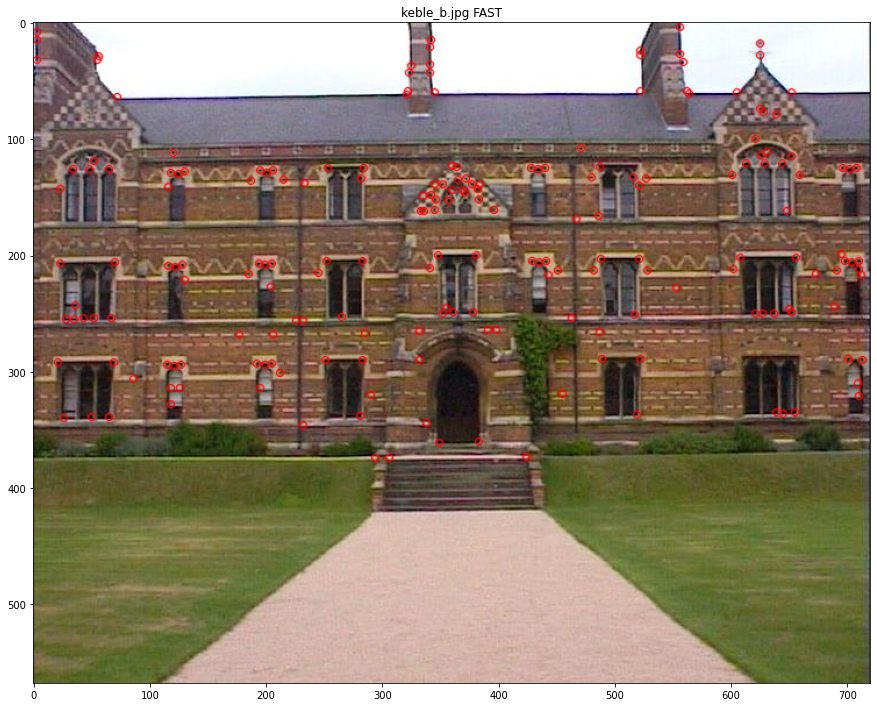

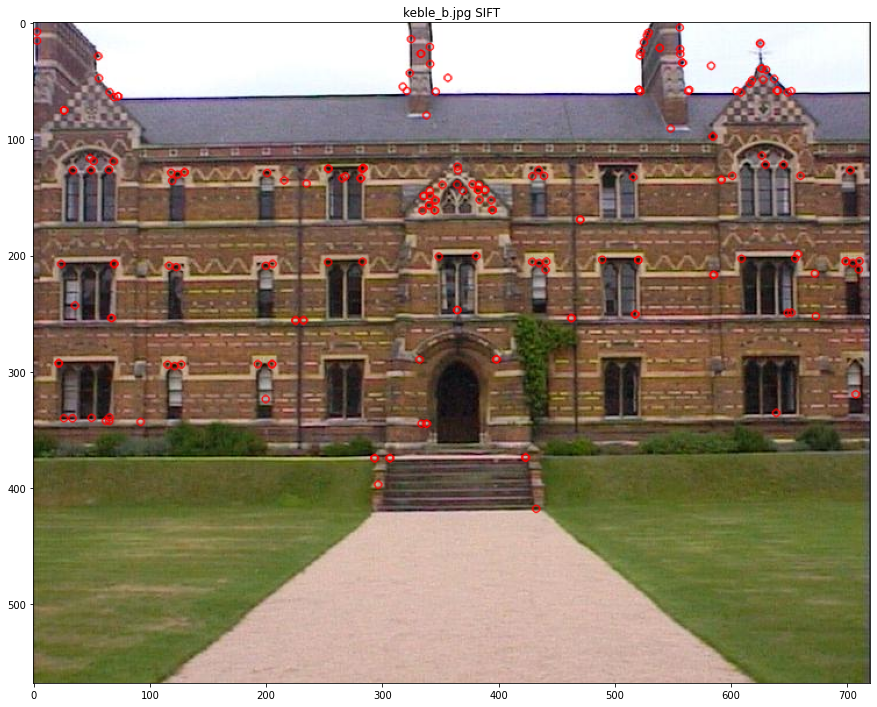

In [9]:
for img in image_list:
    img.draw_keypoints(img.best_FAST_kp, img.name + " FAST")
    img.draw_keypoints(img.best_SIFT_kp, img.name + " SIFT")

In [10]:
# computing the descriptor of SIFT
for img in image_list:
    img.get_sift_des()

In [18]:
match12.image1.SIFT_des

array([[  5.,  61.,  27., ...,   3.,   2.,  13.],
       [ 98.,  75.,  44., ...,  36.,  46.,  13.],
       [  6.,   4.,   4., ...,  58.,  20.,   3.],
       ...,
       [ 54., 131.,   4., ...,   1.,   1.,   5.],
       [  0.,   0.,   0., ...,   0.,   2.,   8.],
       [ 72.,  15.,   1., ...,   0.,   0.,   0.]], dtype=float32)

In [11]:
class images_match():
    good_matches = []
    image1 = []
    image2 = []
    #verd_marches = []
    def __init__(self, images1, images2):
        self.image1 = images1
        self.image2 = images2
        self.brute_force_matching()
    def brute_force_matching(self):
        descriptors1 = self.image1.SIFT_des
        descriptors2 = self.image2.SIFT_des
        matcher = cv.DescriptorMatcher_create(cv.DescriptorMatcher_FLANNBASED)
        knn_matches = matcher.knnMatch(descriptors1, descriptors2, 2)
        ratio_thresh = 0.8
        good_matches = []
        for m,n in knn_matches:
            if m.distance < ratio_thresh * n.distance:
                good_matches.append(m)
        self.good_matches = good_matches
        
    def cross_val(self):
        match1 = self.good_matches                                     # matches from image1 to image2
        match2 = images_match(self.image2, self.image1).good_matches   # matches from image2 to image1
        ver_marches = []
        for match in match1:        # we are checking every point in the match from image1 to image2 
            qu = match.queryIdx     # the index of the keypoints in first image
            tr = match.trainIdx     # the index of the keypoints in second image
            
            # notice, now we come to the match from image2 to image1, not the match from image1 to image2
            # the queryIdx in the first match, is the index of the first keypoints in image1, when it comes to the matches from image2 to image1, the queryIdx becomes the index of the first keypoints in image2.
            
            for val_match in match2:             # checking every point in image2
                if (val_match.queryIdx == tr):      
                    if (val_match.trainIdx == qu):  
                        ver_marches.append(match)
                        
        
        self.verd_matches = ver_marches
    def drawmatches(self, verd_matches):
        img1 = self.image1.color
        img2 = self.image2.color
        keypoints1 = self.image1.best_SIFT_kp
        keypoints2 = self.image2.best_SIFT_kp
        good_matches = verd_matches
              
        img_matches = np.empty((max(img1.shape[0], img2.shape[0]), img1.shape[1]+img2.shape[1], 3), dtype=np.uint8)
        cv.drawMatches(img1, keypoints1, img2, keypoints2, good_matches, img_matches,                     flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
#-- Show detected matches    
    #cv.imshow('Good Matches', img_matches)
    # OpenCV does not use RGB, it uses BGR (standing for blue, green, red). You need to swap the order of the red and the blue. 
        b,g,r = cv.split(img_matches)           # get b, g, r
        img_matches = cv.merge([r,g,b])     # switch it to r, g, b
        plt.imshow(img_matches)
        plt.title("images match")
        plt.show()
    def query_points(self):
        points_array = np.asarray([])
        for match in self.verd_matches:
            index = match.queryIdx
            #np.asarray(match20.image1.best_SIFT_kp[4].pt)
            #print(index)
            coordinates = np.asarray(self.image1.best_SIFT_kp[index].pt)
            points_array = np.append(points_array, coordinates)
        points_array = points_array.reshape(points_array.shape[0] // 2, 2)
        print(points_array)
        length = np.shape(points_array)[0]
        points_array = np.c_[points_array, np.ones(length) ]   
        
        return points_array
    def train_points(self):
        points_array = np.asarray([])
        for match in self.verd_matches:
            index = match.trainIdx
            #np.asarray(match20.image2.best_SIFT_kp[4].pt)
            #print(index)
            coordinates = np.asarray(self.image2.best_SIFT_kp[index].pt)
            points_array = np.append(points_array, coordinates)
        points_array = points_array.reshape(points_array.shape[0] // 2, 2)
        print(points_array)
        length = np.shape(points_array)[0]
        points_array = np.c_[points_array, np.ones(length) ]
        
        return points_array

In [12]:
match12 = images_match(image_list[1], image_list[2])
match20 = images_match(image_list[2], image_list[0])

In [13]:
match12.brute_force_matching()
match20.brute_force_matching()

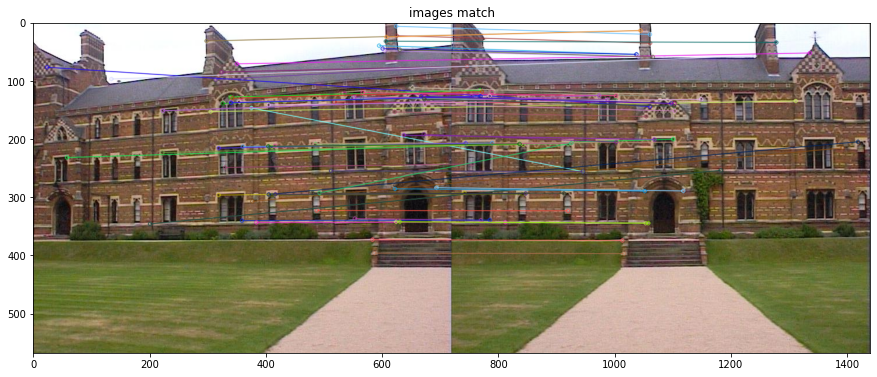

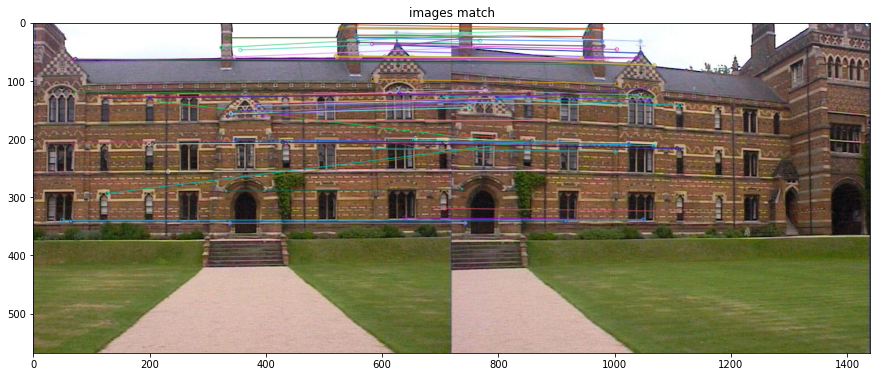

In [14]:
match12.drawmatches(match12.good_matches)
match20.drawmatches(match20.good_matches)

## This part is for cross-validation

In [15]:
#  cross-validation
match12.cross_val()
match20.cross_val()


## we can see there are fewer matches after cross-validation, and there are less incorrect points

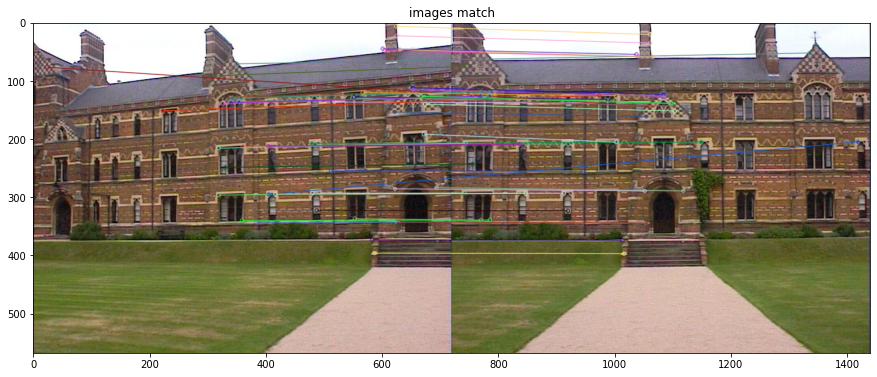

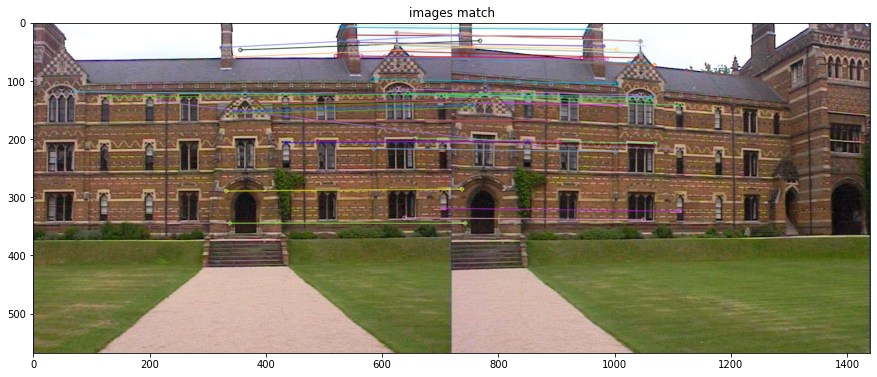

In [16]:
match12.drawmatches(match12.verd_matches)
match20.drawmatches(match20.verd_matches)

In [17]:
trainpoints20 = match20.train_points()
quarypoints20 = match20.query_points()

[[ 48.60461044  31.61016464]
 [289.89608765 142.22213745]
 [289.89608765 142.22213745]
 [329.665802   338.90475464]
 [147.62976074 212.41595459]
 [345.19967651 127.49357605]
 [392.84197998 217.6448822 ]
 [350.02017212 208.00161743]
 [281.23873901 221.85447693]
 [281.23873901 221.85447693]
 [336.89263916  72.40166473]
 [336.89263916  72.40166473]
 [336.89263916  72.40166473]
 [392.62609863 324.45440674]
 [ 35.86267471 142.33959961]
 [283.63760376 105.28752136]
 [323.33355713 124.60837555]
 [ 30.54360199 133.32997131]
 [167.06681824 168.4025116 ]
 [167.06681824 168.4025116 ]
 [283.95678711  46.62098312]
 [347.89175415 211.47038269]
 [ 58.07767105 116.92485809]
 [317.70831299  61.20933533]
 [266.1072998   63.80590057]
 [348.42483521  73.8979187 ]
 [ 77.04353333 131.81509399]
 [138.29182434 121.24333954]
 [ 35.86267471 142.33959961]
 [ 17.45210075 286.37905884]
 [ 30.04627228 146.5428772 ]
 [ 30.04627228 146.5428772 ]
 [325.19674683  52.94661713]
 [325.19674683  52.94661713]
 [304.81716919

## DLT algorithm
## First, normalization

In [25]:
def normalization(points):
    mean = np.mean(points, 0)
    if np.shape(points)[1] == 3: #if the points are in 2d
        centerd = points - mean * np.ones(np.shape(points))      
        square = centerd * centerd
        distance = np.sqrt(square[:, 0] + square[:, 1])
        std = np.mean(distance)
        Tr1 = np.array([[1, 0, -mean[0]], [0, 1, -mean[1]], [0, 0, 1]])
        Tr2 = np.array([[math.sqrt(2) / std, 0, 0], [0, math.sqrt(2) / std, 0], [0, 0, 1]])
        Tr = Tr2 @ Tr1
        return ((Tr @ points.T).T, Tr)
    if np.shape(points)[1] == 4: #if 3d
        centerd = points - mean * np.ones(np.shape(points))      
        square = centerd * centerd
        distance = np.sqrt(square[:, 0] + square[:, 1] + square[:, 2])
        std = np.mean(distance)
        Tr1 = np.array([[1, 0, 0, -mean[0]], [0, 1, 0, -mean[1]], [0, 0, 1, -mean[2]], [0, 0, 0, 1]])
        Tr2 = np.array([[math.sqrt(3) / std, 0, 0, 0], [0, math.sqrt(3) / std, 0, 0], [0, 0, math.sqrt(3) / std, 0], [0, 0, 0, 1]])
        Tr =Tr2 @ Tr1
        return ((Tr @ points.T).T, Tr)

In [286]:
a1, a1m = normalization(quarypoints20)
b1, b1m = normalization(trainpoints20)

## This is the part for Solving a system of linear equations

$\left[\begin{array}{c}\lambda u \\ \lambda v \\ \lambda\end{array}\right]=\mathrm{x}=M \mathrm{X}=\left[\begin{array}{c}A^{T} \\ B^{T} \\ C^{T}\end{array}\right] \mathrm{X}=\left[\begin{array}{c}A^{T} \mathrm{X} \\ B^{T} \mathrm{X} \\ C^{T} \mathrm{X}\end{array}\right]$

$u=\frac{A^{T} \mathrm{X}}{C^{T} \mathrm{X}}$

$v=\frac{B^{T} \mathrm{X}}{C^{T} \mathrm{X}}$

we can write that as 

$u C^{T} \mathrm{X}-A^{T} \mathrm{X}=0$

$v C^{T} \mathrm{X}-B^{T} \mathrm{X}=0$

which is

$\left[\begin{array}{cccccccccccc}-X & -Y & -1 & 0 & 0 & 0 & u X & u Y & u \\ 0 & 0 & 0 & -X & -Y & -1 & v X & v Y & v\end{array}\right]\left[\begin{array}{l}m_{11} \\ m_{12} \\ m_{13} \\ m_{21} \\ m_{22} \\ m_{23} \\ m_{31} \\ m_{32} \\ m_{33} \end{array}\right]=0$



There are more equitions than the unknown parameters, so instead of using **numpy.linalg.solve** , we use singular value decomposition, which is SVD, to solve this kind of equitions. We can get least squares solution of the system.

In [28]:
def get_P_SVD(plane_points, projected_points): #, trPlane, trProje):
    """from the pairs get the martix of P"""
    A = []
    length = np.shape(plane_points)[0]
    for i in range(length ):
        x = plane_points[i][0]
        y = plane_points[i][1]
        #z = plane_points[i][2]
        u = projected_points[i][0]
        v = projected_points[i][1]
        A.append( [x, y, 1, 0, 0, 0, -u*x, -u*y, -u] )
        A.append( [0, 0, 0, x, y, 1, -v*x, -v*y, -v] )
    ##convert A to array
    A = np.asarray(A) 
    #A = A.T @ A
    #Find the 11 parameters:
    U, S, Vh = np.linalg.svd(A)
    #print(S)
    #The parameters are in the last line of Vh and normalize them:
    L = Vh[-1,:] / Vh[-1,-1]
    #Camera projection matrix:
    #print(L)
    H = L.reshape(3,3)
    #Denormalization
    """
    T1 = np.linalg.inv(trProje)
    T2 = trPlane
    H = T1 @ H @ T2
    """
    return H

## RANSAC

In [30]:
def geo_Distance(p1, p2, h):

    estimatep2 = h @ p1.T
    estimatep2 = (1/estimatep2.item(2))*estimatep2

    error = p2 - estimatep2
    return np.linalg.norm(error)

In [61]:
def ransac(trainpoints, quarypoints, thresh=0.55, t=6):
    maxInliers = []
    correspondances = trainpoints.shape[0]
    T = correspondances * thresh
    finalH = None
    
    for i in range(1000):
        #find 4 random points to calculate a homography
        index1 = random.randrange(0, trainpoints.shape[0])
        
        p1_list = []
        p2_list = []
        for j in range(5):
            select_index = random.randrange(0, trainpoints.shape[0])
            p1_list.append(trainpoints[select_index, :])
            p2_list.append(quarypoints[select_index, :])
        
        p1 = np.array(p1_list)
        p2 = np.array(p2_list)

        #call the homography function on those points
        h = get_P_SVD(p1, p2)
        inliers = []

        distances = []
#         set_trace()
        for k in range(trainpoints.shape[0]):
            d = geo_Distance(trainpoints[k, :], quarypoints[k, :], h)
#             print("Iteration: ", i, "Distance: ", d)
            if d < t:
                inliers.append(trainpoints[k, :])
                inliers.append(quarypoints[k, :])
            distances.append(d)

        if len(inliers) > len(maxInliers):
            maxInliers = inliers
            finalH = h
        print("Iteration: ", i, "Total points: ", correspondances, " NumInliers: ", len(inliers)/2, "Max inliers: ", len(maxInliers)/2, "T: ", T, "Avg. distance: ", np.mean(distances))

        if len(maxInliers)/2 > T:
            break
    return finalH, maxInliers

In [62]:
H, inliners = ransac(trainpoints20, quarypoints20, thresh = 0.60, t = 5)

Iteration:  0 Total points:  54  NumInliers:  48.0 Max inliers:  48.0 T:  32.4 Avg. distance:  23.140843801416608


In [69]:
def display_image(img, img_title):
    # OpenCV does not use RGB, it uses BGR (standing for blue, green, red). You need to swap the order of the red and the blue. 
    b,g,r = cv.split(img)           # get b, g, r
    rgb_img = cv.merge([r,g,b])     # switch it to r, g, b
    plt.imshow(rgb_img)
    plt.title(img_title)
    plt.show()

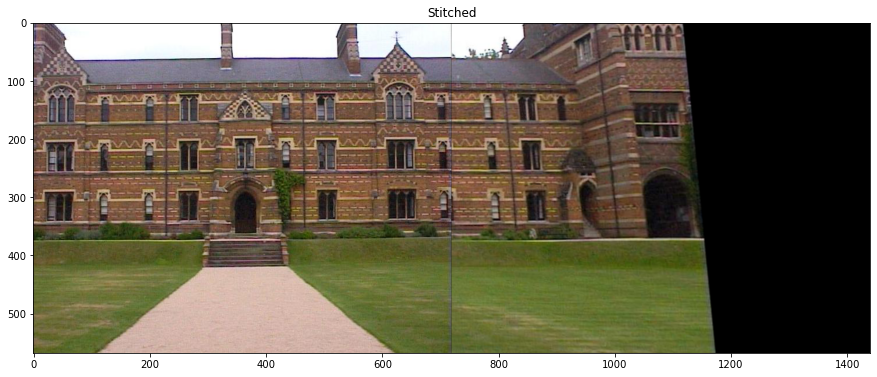

In [70]:
result = cv.warpPerspective(image_list[0].color, H, (image_list[2].color.shape[1] + image_list[0].color.shape[1], image_list[0].color.shape[0]))
result[0:image_list[2].color.shape[0], 0:image_list[2].color.shape[1]] = image_list[2].color
display_image(result, "Stitched")